In [5]:
import sys
import copy
sys.path.insert(0, "../../")
from classes.calculators.lennardjones import LennardJones
from classes.atom_classes.atom import Atom
from classes.atom_classes.atom_collection import Atom_Collection
from classes.atom_classes.atom_collection_plotter import Animator, Atom_Collection_Plotter
from classes.optimizers.md_simulator1 import MDT_simulator
from classes.optimizers.random_struct_search import Line_searcher1
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
plt.rc('animation', html='jshtml')

In [6]:
frozens = [True for i in range(5)] + [False for i in range(2)]
poss = [np.array([-2.0+i, 0.0]) for i in range(5)] + [np.array([-0.5,1.3]), np.array([0.5,1.0])]

atom_list = [Atom(position=pos, frozen=frozen) for frozen, pos in zip(frozens, poss)]
atom_col = Atom_Collection(atomlist=atom_list)
atom_col.calculator = LennardJones()
optimizer = Line_searcher1(atom_col=atom_col)
optimizer.run(track=False)
opt_col = optimizer.best_atom_col
opt_col.calculator = LennardJones()

In [7]:
class MD_animator(Animator):
    def __init__(self,
                 e_kin_line=None,
                 e_pot_line=None,
                 e_tot_line=None, 
                 default_cols=("C0", "C1"), 
                 markersize=50, 
                 scale_with_mass=False, 
                 alpha=1) -> None:
        super().__init__(default_cols, markersize, scale_with_mass, alpha)
        self.earlier_pos = None
        self.e_kin_line = e_kin_line
        self.e_pot_line = e_pot_line
        self.e_tot_line = e_tot_line

    def animate(self, i, plot_col, positions, pot_es, kin_es, tot_es):
        plot_col.set_atom_positions(positions[i])
        plot_elems = self(plot_col)
        xs = np.linspace(0, i, i)
        self.e_kin_line.set_data(xs, kin_es[0:i])
        self.e_pot_line.set_data(xs, pot_es[0:i])
        self.e_tot_line.set_data(xs, tot_es[0:i])
        return plot_elems["atoms"] + [self.e_kin_line, self.e_pot_line, self.e_tot_line]

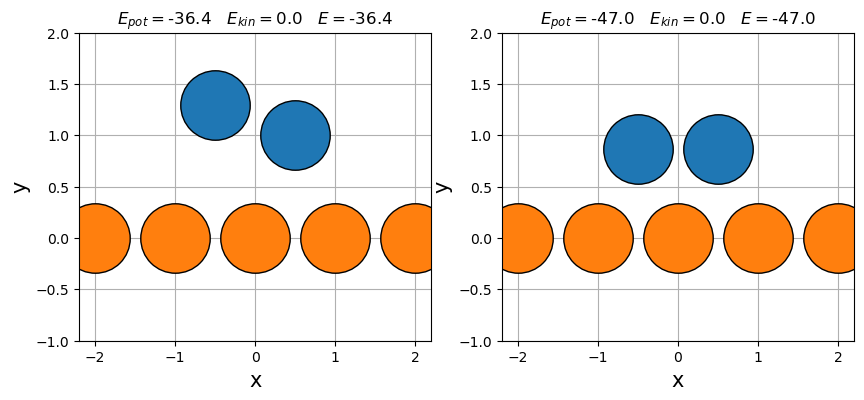

In [8]:
fig, axs = plt.subplots(1,2, figsize=(10, 4))

animator = MD_animator()

for ax, plot_col in zip(axs, [atom_col, opt_col]):
    pot_e = plot_col.get_potential_energy()
    kin_e = plot_col.get_kinetic_energy()
    e = pot_e+kin_e
    ax.set_title(r"$E_{pot}=$"+f"{round(pot_e, 1)}"+"   "+ r"$E_{kin}=$"+f"{round(kin_e, 1)}"+"   "+r"$E=$"+f"{round(e, 1)}")
    ax.set_xlabel(r"x", fontsize=15)
    ax.set_ylabel(r"y", fontsize=15)
    ax.set_ylim([-1.0, 2.0])
    ax.grid()
    
    animator(atom_col=plot_col, ax=ax)
    plot_col.reset_plot_axes()


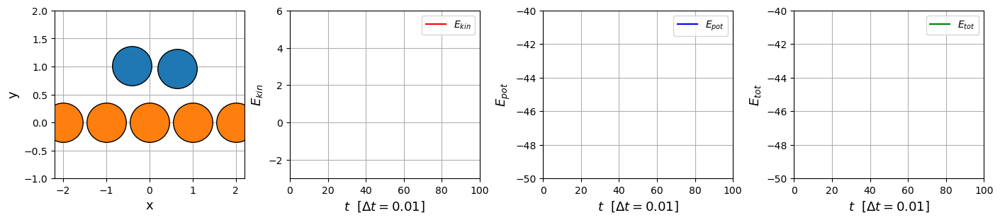

In [9]:
peturbed_col = copy.deepcopy(opt_col)
peturbed_col.move_atom([5,6], 0.15*np.random.rand(2,2))
md_simulator = MDT_simulator(atom_col=peturbed_col, temp=0.0, log_level="all_steps", integration_method="verlet_integration")
md_simulator.N2_integration(time_step=0.01, integrate_steps=100)
md_cols = md_simulator.logged_atom_cols

fig, axs = plt.subplots(1, 4, figsize=(14,3), layout="constrained")
for ax in axs:
    ax.grid()

axs[1].set_ylim([-3, 6])
axs[2].set_ylim([-50, -40])
axs[3].set_ylim([-50, -40])

e_kin_line = axs[1].plot([], [], "-", c="r", label=r"$E_{kin}$")[0]
e_pot_line = axs[2].plot([], [], "-", c="b", label=r"$E_{pot}$")[0]
e_tot_line = axs[3].plot([], [], "-", c="g", label=r"$E_{tot}$")[0]

for ax in axs[1:]:
    ax.set_xlim([0,100])
    ax.legend()
    ax.set_xlabel(r"$t$"+ r"  $\left[\Delta t = 0.01\right]$", fontsize=13)

axs[0].set_xlabel(r"x", fontsize=13)
axs[0].set_ylabel(r"y", fontsize=13)
axs[0].set_ylim([-1.0, 2.0])

axs[1].set_ylabel(r"$E_{kin}$", fontsize=13)
axs[2].set_ylabel(r"$E_{pot}$", fontsize=13)
axs[3].set_ylabel(r"$E_{tot}$", fontsize=13)

md_animator = MD_animator(e_kin_line, e_pot_line, e_tot_line, markersize=40)
_ = md_animator(atom_col=peturbed_col, ax=axs[0])

In [10]:
pot_es = np.array([md_col.get_potential_energy() for md_col in md_cols])
kin_es = np.array([md_col.get_kinetic_energy() for md_col in md_cols])
positions = np.array([md_col.positions for md_col in md_cols])
tot_es = pot_es+kin_es


def update(i, animator, positions, pot_es, kin_es, tot_es):
    plot_elems = animator.animate(i, peturbed_col, positions, pot_es, kin_es, tot_es)
    return plot_elems

In [11]:
anim = animation.FuncAnimation(fig,
                               update,
                               frames=np.arange(0, 99, 1),
                               fargs=(md_animator, positions, pot_es, kin_es, tot_es),
                               interval=75,
                               blit=True)
anim

In [12]:
writer = animation.PillowWriter(fps=15,
                                 metadata=dict(artist='Me'),
                                 bitrate=1800)
anim.save("verlet_sim.gif", writer=writer)

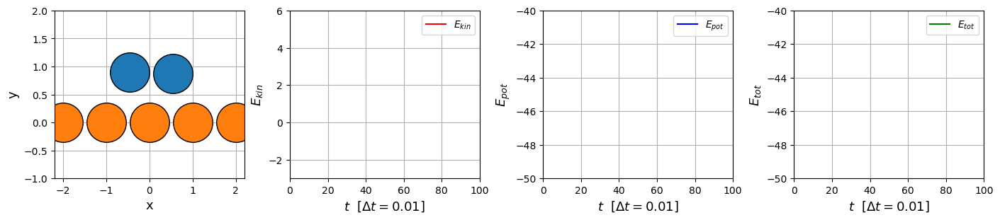

In [13]:
peturbed_col = copy.deepcopy(opt_col)
peturbed_col.move_atom([5,6], 0.15*np.random.rand(2,2))
md_simulator = MDT_simulator(atom_col=peturbed_col, temp=0.0, log_level="all_steps", integration_method="euler_integration")
md_simulator.N2_integration(time_step=0.01, integrate_steps=100)
md_cols = md_simulator.logged_atom_cols

fig, axs = plt.subplots(1, 4, figsize=(14,3), layout="constrained")
for ax in axs:
    ax.grid()

axs[1].set_ylim([-3, 6])
axs[2].set_ylim([-50, -40])
axs[3].set_ylim([-50, -40])

e_kin_line = axs[1].plot([], [], "-", c="r", label=r"$E_{kin}$")[0]
e_pot_line = axs[2].plot([], [], "-", c="b", label=r"$E_{pot}$")[0]
e_tot_line = axs[3].plot([], [], "-", c="g", label=r"$E_{tot}$")[0]

for ax in axs[1:]:
    ax.set_xlim([0,100])
    ax.legend()
    ax.set_xlabel(r"$t$"+ r"  $\left[\Delta t = 0.01\right]$", fontsize=13)

axs[0].set_xlabel(r"x", fontsize=13)
axs[0].set_ylabel(r"y", fontsize=13)
axs[0].set_ylim([-1.0, 2.0])

axs[1].set_ylabel(r"$E_{kin}$", fontsize=13)
axs[2].set_ylabel(r"$E_{pot}$", fontsize=13)
axs[3].set_ylabel(r"$E_{tot}$", fontsize=13)

md_animator = MD_animator(e_kin_line, e_pot_line, e_tot_line, markersize=40)
_ = md_animator(atom_col=peturbed_col, ax=axs[0])

In [14]:
pot_es = np.array([md_col.get_potential_energy() for md_col in md_cols])
kin_es = np.array([md_col.get_kinetic_energy() for md_col in md_cols])
positions = np.array([md_col.positions for md_col in md_cols])
tot_es = pot_es+kin_es

In [15]:
anim = animation.FuncAnimation(fig,
                               update,
                               frames=np.arange(0, 99, 1),
                               fargs=(md_animator, positions, pot_es, kin_es, tot_es),
                               interval=75,
                               blit=True)
anim

In [16]:
writer = animation.PillowWriter(fps=15,
                                 metadata=dict(artist='Me'),
                                 bitrate=1800)
anim.save("euler_sim.gif", writer=writer)